<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
    
<h1 style="padding: 8px;color:white; display:fill;background-color:#555555; border-radius:5px; font-size:150%"><b> Table of contents </b></h1>

 - [**Introduction**](#1)

 - [**Import and Set Up**](#2)

 - [**Pre-processing and feature selection**](#3)
    
 - [**Modelling and Evaluation**](#4)
    - [**Decision Tree**](#4_3)
    - [**Random Forest**](#4_5)
    - [**Gradient Boosting Classifier**](#4_6)
    - [**Neural Network MLP (Keras)**](#4_8)
    - [**CNN**](#4_9)
    
 - [**Evaluate**](#5)
 - [**Explainability**](#5)
   

<a id='1'></a>
# <p style="padding: 8px;color:white; display:fill;background-color:#555555; border-radius:5px; font-size:100%"> <b>Introduction</b>

This Notebook is about transforming and modelling the data. The study has an all-in approach (using all descriptive features).

<a id='2'></a>
# <p style="padding: 8px;color:white; display:fill;background-color:#555555; border-radius:5px; font-size:100%"> <b>Import and Set up</b>

In [1]:
!pip install tensorflow
!pip install nbformat
!pip install graphviz
!pip install dtreeviz
!pip install shap
!pip install lime
!pip install joblib
!pip install xgboost
!pip install eli5

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=53952fa9272e6f34563783091a810efe70691437288ab4b71d7eaf19b4d1a2e0
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.9/190.9 MB 6.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.3.1+cu121 requires nvidia-cublas-cu12==12.1.3.1; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-cu

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import warnings
import lime
import shap
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)
import time

plt.style.use('ggplot')
%matplotlib inline

# sklearn: data preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder

# sklearn: train model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.metrics import precision_recall_curve, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report, mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree



from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.metrics import Precision, Recall, AUC




# sklearn classifiers

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

from sklearn import datasets, ensemble, model_selection
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier

In [3]:
from IPython.core.display import display, HTML
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio


import seaborn as sns
from importlib import reload
import matplotlib.pyplot as plt
import matplotlib
import warnings
import dtreeviz
from sklearn.tree import export_text

# Configure Jupyter Notebook
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 500)
pd.set_option('display.expand_frame_repr', False)
# pd.set_option('max_colwidth', -1)
display(HTML("<style>div.output_scroll { height: 35em; }</style>"))

reload(plt)
%matplotlib inline
%config InlineBackend.figure_format ='retina'

warnings.filterwarnings('ignore')

# configure plotly graph objects
pio.renderers.default = 'iframe'
# pio.renderers.default = 'vscode'

pio.templates["ck_template"] = go.layout.Template(
    layout_colorway = px.colors.sequential.Viridis,
#     layout_hovermode = 'closest',
#     layout_hoverdistance = -1,
    layout_autosize=False,
    layout_width=800,
    layout_height=600,
    layout_font = dict(family="Calibri Light"),
    layout_title_font = dict(family="Calibri"),
    layout_hoverlabel_font = dict(family="Calibri Light"),
#     plot_bgcolor="white",
)

# pio.templates.default = 'seaborn+ck_template+gridon'
pio.templates.default = 'ck_template+gridon'
# pio.templates.default = 'seaborn+gridon'
# pio.templates

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
training = pd.read_csv('/content/drive/My Drive/UNSW_NB15_training.csv')
testing = pd.read_csv('/content/drive/My Drive/UNSW_NB15_testing.csv')
print("training ",training.shape)
print("testing ",testing.shape)

training  (175341, 45)
testing  (82332, 45)


In [6]:
training.head(n=5)

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,252,254,14158.942380,8495.365234,0,0,24.295600,8.375000,30.177547,11.830604,255,621772692,2202533631,255,0.000000,0.000000,0.000000,43,43,0,0,1,0,1,1,1,1,0,0,0,1,1,0,Normal,0
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,62,252,8395.112305,503571.312500,2,17,49.915000,15.432865,61.426934,1387.778330,255,1417884146,3077387971,255,0.000000,0.000000,0.000000,52,1106,0,0,43,1,1,1,1,2,0,0,0,1,6,0,Normal,0
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,62,252,1572.271851,60929.230470,1,6,231.875571,102.737203,17179.586860,11420.926230,255,2116150707,2963114973,255,0.111897,0.061458,0.050439,46,824,0,0,7,1,2,1,1,3,0,0,0,2,6,0,Normal,0
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,62,252,2740.178955,3358.622070,1,3,152.876547,90.235726,259.080172,4991.784669,255,1107119177,1047442890,255,0.000000,0.000000,0.000000,52,64,0,0,1,1,2,1,1,3,1,1,0,2,1,0,Normal,0
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,254,252,8561.499023,3987.059814,2,1,47.750333,75.659602,2415.837634,115.807000,255,2436137549,1977154190,255,0.128381,0.071147,0.057234,53,45,0,0,43,1,2,2,1,40,0,0,0,2,39,0,Normal,0


In [7]:
testing.head(n=5)

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.0902,254,0,180363632.0,0.0,0,0,0.011,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,248,0,0,0,2,2,1,1,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.0003,254,0,881000000.0,0.0,0,0,0.008,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,881,0,0,0,2,2,1,1,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.0051,254,0,854400000.0,0.0,0,0,0.005,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,534,0,0,0,3,2,1,1,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.6608,254,0,600000000.0,0.0,0,0,0.006,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,450,0,0,0,3,2,2,2,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.0025,254,0,850400000.0,0.0,0,0,0.010,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,1063,0,0,0,3,2,2,2,1,3,0,0,0,2,3,0,Normal,0


In [8]:
all(training.columns == testing.columns)

True

In [9]:
df = pd.concat([training,testing])
df = df.reset_index(drop=True)

df.head()

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,252,254,14158.942380,8495.365234,0,0,24.295600,8.375000,30.177547,11.830604,255,621772692,2202533631,255,0.000000,0.000000,0.000000,43,43,0,0,1,0,1,1,1,1,0,0,0,1,1,0,Normal,0
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,62,252,8395.112305,503571.312500,2,17,49.915000,15.432865,61.426934,1387.778330,255,1417884146,3077387971,255,0.000000,0.000000,0.000000,52,1106,0,0,43,1,1,1,1,2,0,0,0,1,6,0,Normal,0
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,62,252,1572.271851,60929.230470,1,6,231.875571,102.737203,17179.586860,11420.926230,255,2116150707,2963114973,255,0.111897,0.061458,0.050439,46,824,0,0,7,1,2,1,1,3,0,0,0,2,6,0,Normal,0
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,62,252,2740.178955,3358.622070,1,3,152.876547,90.235726,259.080172,4991.784669,255,1107119177,1047442890,255,0.000000,0.000000,0.000000,52,64,0,0,1,1,2,1,1,3,1,1,0,2,1,0,Normal,0
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,254,252,8561.499023,3987.059814,2,1,47.750333,75.659602,2415.837634,115.807000,255,2436137549,1977154190,255,0.128381,0.071147,0.057234,53,45,0,0,43,1,2,2,1,40,0,0,0,2,39,0,Normal,0


In [10]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,257673.0,NaN,NaN,NaN,72811.823858,48929.917641,1.0,32210.0,64419.0,110923.0,175341.0
dur,257673.0,NaN,NaN,NaN,1.246715,5.974305,0.0,0.000008,0.004285,0.685777,59.999989
proto,257673,133,tcp,123041,NaN,NaN,NaN,NaN,NaN,NaN,NaN
service,257673,13,-,141321,NaN,NaN,NaN,NaN,NaN,NaN,NaN
state,257673,11,FIN,117164,NaN,NaN,NaN,NaN,NaN,NaN,NaN
spkts,257673.0,NaN,NaN,NaN,19.777144,135.947152,1.0,2.0,4.0,12.0,10646.0
dpkts,257673.0,NaN,NaN,NaN,18.514703,111.985965,0.0,0.0,2.0,10.0,11018.0
sbytes,257673.0,NaN,NaN,NaN,8572.951803,173773.880605,24.0,114.0,528.0,1362.0,14355774.0
dbytes,257673.0,NaN,NaN,NaN,14387.287543,146199.281938,0.0,0.0,178.0,1064.0,14657531.0
rate,257673.0,NaN,NaN,NaN,91253.91244,160344.636693,0.0,30.789277,2955.664893,125000.0003,1000000.003


In [11]:
df.columns

Index(['id', 'dur', 'proto', 'service', 'state', 'spkts', 'dpkts', 'sbytes',
       'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss',
       'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin',
       'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports', 'attack_cat', 'label'],
      dtype='object')

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 257673 entries, 0 to 257672
Data columns (total 45 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   id                 257673 non-null  int64  
 1   dur                257673 non-null  float64
 2   proto              257673 non-null  object 
 3   service            257673 non-null  object 
 4   state              257673 non-null  object 
 5   spkts              257673 non-null  int64  
 6   dpkts              257673 non-null  int64  
 7   sbytes             257673 non-null  int64  
 8   dbytes             257673 non-null  int64  
 9   rate               257673 non-null  float64
 10  sttl               257673 non-null  int64  
 11  dttl               257673 non-null  int64  
 12  sload              257673 non-null  float64
 13  dload              257673 non-null  float64
 14  sloss              257673 non-null  int64  
 15  dloss              257673 non-null  int64  
 16  si

In [13]:
df.attack_cat.unique()

array(['Normal', 'Backdoor', 'Analysis', 'Fuzzers', 'Shellcode',
       'Reconnaissance', 'Exploits', 'DoS', 'Worms', 'Generic'],
      dtype=object)

In [14]:
# check if there are Null values
print(df.isnull().values.any())

False


attack_cat
Normal            93000
Generic           58871
Exploits          44525
Fuzzers           24246
DoS               16353
Reconnaissance    13987
Analysis           2677
Backdoor           2329
Shellcode          1511
Worms               174
Name: count, dtype: int64


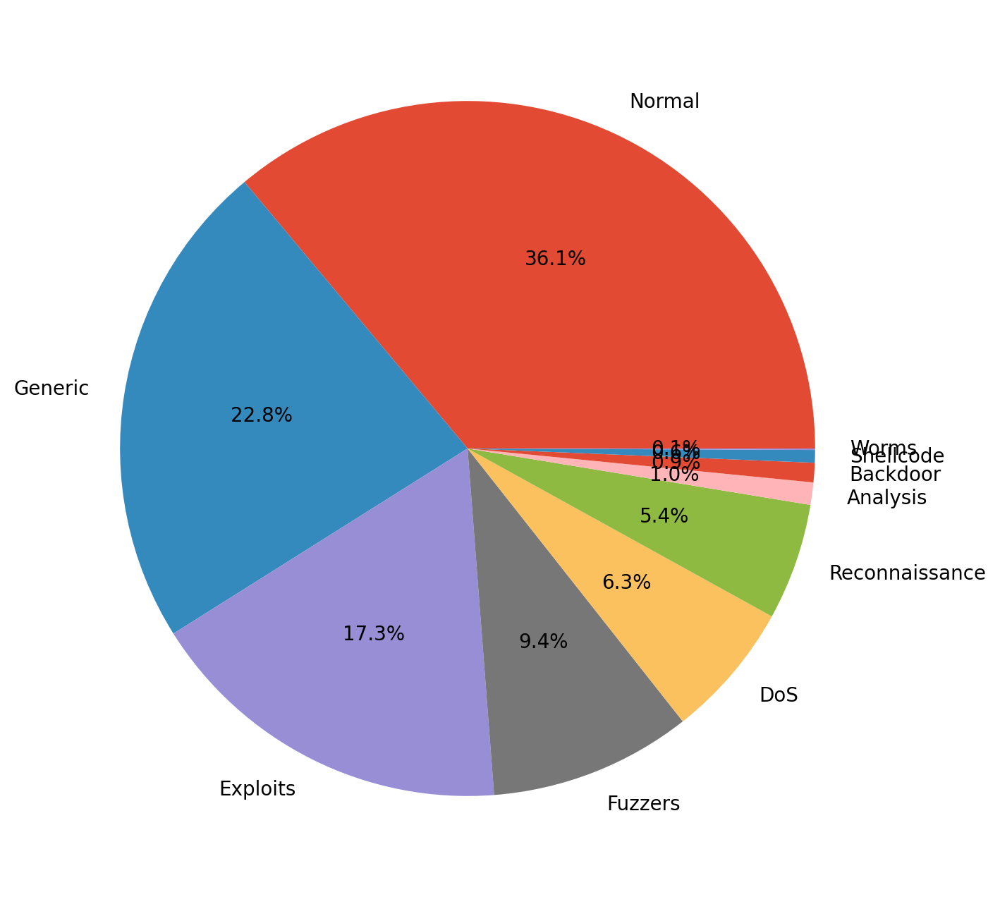

In [15]:
validAttacks = df['attack_cat'].value_counts()
print(validAttacks)

plt.figure(figsize = (15,8))
plt.pie(validAttacks,labels = validAttacks.index, autopct = '%1.1f%%')
plt.show()

# Categorical Data

In [16]:
le = LabelEncoder()
df['proto']=le.fit_transform(df['proto'])
df['service']=le.fit_transform(df['service'])
df['state']=le.fit_transform(df['state'])

df['attack_cat']=le.fit_transform(df['attack_cat'])

In [17]:
df.head(5)

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,113,0,4,6,4,258,172,74.087490,252,254,14158.942380,8495.365234,0,0,24.295600,8.375000,30.177547,11.830604,255,621772692,2202533631,255,0.000000,0.000000,0.000000,43,43,0,0,1,0,1,1,1,1,0,0,0,1,1,0,6,0
1,2,0.649902,113,0,4,14,38,734,42014,78.473372,62,252,8395.112305,503571.312500,2,17,49.915000,15.432865,61.426934,1387.778330,255,1417884146,3077387971,255,0.000000,0.000000,0.000000,52,1106,0,0,43,1,1,1,1,2,0,0,0,1,6,0,6,0
2,3,1.623129,113,0,4,8,16,364,13186,14.170161,62,252,1572.271851,60929.230470,1,6,231.875571,102.737203,17179.586860,11420.926230,255,2116150707,2963114973,255,0.111897,0.061458,0.050439,46,824,0,0,7,1,2,1,1,3,0,0,0,2,6,0,6,0
3,4,1.681642,113,3,4,12,12,628,770,13.677108,62,252,2740.178955,3358.622070,1,3,152.876547,90.235726,259.080172,4991.784669,255,1107119177,1047442890,255,0.000000,0.000000,0.000000,52,64,0,0,1,1,2,1,1,3,1,1,0,2,1,0,6,0
4,5,0.449454,113,0,4,10,6,534,268,33.373826,254,252,8561.499023,3987.059814,2,1,47.750333,75.659602,2415.837634,115.807000,255,2436137549,1977154190,255,0.128381,0.071147,0.057234,53,45,0,0,43,1,2,2,1,40,0,0,0,2,39,0,6,0


In [18]:
# Checking for non-finite values (e.g., NaN or Inf)
False in np.isfinite(df).values

False

### Droppin Irrelevant Columns

In [19]:
list_drop = ['id','attack_cat']
df = df.drop(list_drop, axis=1)

In [20]:
df.head()

,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
0,0.121478,113,0,4,6,4,258,172,74.087490,252,254,14158.942380,8495.365234,0,0,24.295600,8.375000,30.177547,11.830604,255,621772692,2202533631,255,0.000000,0.000000,0.000000,43,43,0,0,1,0,1,1,1,1,0,0,0,1,1,0,0
1,0.649902,113,0,4,14,38,734,42014,78.473372,62,252,8395.112305,503571.312500,2,17,49.915000,15.432865,61.426934,1387.778330,255,1417884146,3077387971,255,0.000000,0.000000,0.000000,52,1106,0,0,43,1,1,1,1,2,0,0,0,1,6,0,0
2,1.623129,113,0,4,8,16,364,13186,14.170161,62,252,1572.271851,60929.230470,1,6,231.875571,102.737203,17179.586860,11420.926230,255,2116150707,2963114973,255,0.111897,0.061458,0.050439,46,824,0,0,7,1,2,1,1,3,0,0,0,2,6,0,0
3,1.681642,113,3,4,12,12,628,770,13.677108,62,252,2740.178955,3358.622070,1,3,152.876547,90.235726,259.080172,4991.784669,255,1107119177,1047442890,255,0.000000,0.000000,0.000000,52,64,0,0,1,1,2,1,1,3,1,1,0,2,1,0,0
4,0.449454,113,0,4,10,6,534,268,33.373826,254,252,8561.499023,3987.059814,2,1,47.750333,75.659602,2415.837634,115.807000,255,2436137549,1977154190,255,0.128381,0.071147,0.057234,53,45,0,0,43,1,2,2,1,40,0,0,0,2,39,0,0


## Splitting Data

In [21]:
X = df.iloc[:,:-1]
y = df.iloc[:,-1]

In [22]:
X.head()
feature_names = list(X.columns)
np.shape(X)

(257673, 42)

In [23]:
len(feature_names)

42

<a id='4'></a>
# <p style="padding: 8px;color:white; display:fill;background-color:#555555; border-radius:5px; font-size:100%"> <b>Modelling and Evaluation</b>

### Split test and training
In this section the data is split into test and training sets using stratified sampling.

In [24]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, mean_squared_error
from sklearn.model_selection import cross_val_score
import pandas as pd
import numpy as np
import time

def cross_val_performance(X_train, y_train, model):
    accuracies = cross_val_score(estimator=model, X=X_train, y=y_train, cv=5, scoring='accuracy')
    recalls = cross_val_score(estimator=model, X=X_train, y=y_train, cv=5, scoring='recall_macro')
    precisions = cross_val_score(estimator=model, X=X_train, y=y_train, cv=5, scoring='precision_macro')
    f1_scores = cross_val_score(estimator=model, X=X_train, y=y_train, cv=5, scoring='f1_macro')

    return {
        'CV Accuracy': accuracies.mean(),
        'CV Recall': recalls.mean(),
        'CV Precision': precisions.mean(),
        'CV F1-Score': f1_scores.mean()
    }

def fit_and_evaluate(model, X_train, X_test, y_train, y_test):
    # Track training time
    start_train = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start_train

    # Track prediction time
    start_pred = time.time()
    y_pred = model.predict(X_test)
    pred_time = time.time() - start_pred

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Calculate True Negative Rate (TNR), False Positive Rate (FPR), False Negative Rate (FNR) for each class
    num_classes = cm.shape[0]
    tnrs, fprs, fnrs = [], [], []
    for i in range(num_classes):
        tn = np.sum(cm) - (np.sum(cm[i, :]) + np.sum(cm[:, i]) - cm[i, i])
        fp = np.sum(cm[:, i]) - cm[i, i]
        fn = np.sum(cm[i, :]) - cm[i, i]
        tp = cm[i, i]

        tnr = tn / (tn + fp) if (tn + fp) > 0 else np.nan
        fpr = fp / (fp + tn) if (fp + tn) > 0 else np.nan
        fnr = fn / (fn + tp) if (fn + tp) > 0 else np.nan

        tnrs.append(tnr)
        fprs.append(fpr)
        fnrs.append(fnr)

    # Average metrics for multi-class
    tnr_avg = np.nanmean(tnrs)
    fpr_avg = np.nanmean(fprs)
    fnr_avg = np.nanmean(fnrs)

    # Calculate performance metrics
    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
    f1s = f1_score(y_test, y_pred, average='weighted')
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    return {
        'Test Accuracy': accuracy,
        'Test Recall': recall,
        'Test Precision': precision,
        'Test F1-Score': f1s,
        'TNR (Average)': tnr_avg,
        'FPR (Average)': fpr_avg,
        'FNR (Average)': fnr_avg,
        'Training Time': train_time,
        'Prediction Time': pred_time,
        'Total Time': train_time + pred_time,
        'RMSE': rmse
    }

def run_experiment(model, X_train, X_test, y_train, y_test):
    # Cross-validation results
    cv_results = cross_val_performance(X_train, y_train, model)

    # Test results
    test_results = fit_and_evaluate(model, X_train, X_test, y_train, y_test)

    # Combine results into a DataFrame
    model_performance = pd.DataFrame([{
        'CV Accuracy': cv_results.get('CV Accuracy', np.nan),
        'CV Recall': cv_results.get('CV Recall', np.nan),
        'CV Precision': cv_results.get('CV Precision', np.nan),
        'CV F1-Score': cv_results.get('CV F1-Score', np.nan),
        'Test Accuracy': test_results['Test Accuracy'],
        'Test Recall': test_results['Test Recall'],
        'Test Precision': test_results['Test Precision'],
        'Test F1-Score': test_results['Test F1-Score'],
        'TNR (Average)': test_results['TNR (Average)'],
        'FPR (Average)': test_results['FPR (Average)'],
        'FNR (Average)': test_results['FNR (Average)'],
        'Training Time': test_results['Training Time'],
        'Prediction Time': test_results['Prediction Time'],
        'Total Time': test_results['Total Time'],
        #'RMSE': test_results['RMSE']
    }])

    # Print results in the specified format
    print(f"Accuracy: {test_results['Test Accuracy']:.2%}")
    print(f"Recall: {test_results['Test Recall']:.2%}")
    print(f"Precision: {test_results['Test Precision']:.2%}")
    print(f"F1-Score: {test_results['Test F1-Score']:.2%}")
    print(f"TNR (Average): {test_results['TNR (Average)']:.2%}")
    print(f"FPR (Average): {test_results['FPR (Average)']:.2%}")
    print(f"FNR (Average): {test_results['FNR (Average)']:.2%}")
    print(f"Time to train: {test_results['Training Time']:.2f} s")
    print(f"Time to predict: {test_results['Prediction Time']:.2f} s")
    print(f"Total time: {test_results['Total Time']:.2f} s")
    #print(f"RMSE: {test_results['RMSE']:.2f}")

    return model_performance

In [25]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.2,
                                                    random_state = 42,
                                                    stratify=y)

In [26]:
# Initialize the overall performance DataFrame
overall_performance = pd.DataFrame(columns=['Model', 'CV Accuracy', 'CV Recall', 'CV Precision',
                                           'CV F1-Score', 'Test Accuracy', 'Test Recall',
                                           'Test Precision', 'Test F1-Score', 'TNR (Average)',
                                           'FPR (Average)', 'FNR (Average)', 'Training Time',
                                           'Prediction Time', 'Total Time'])

In [27]:
unique_classes = np.unique(y_test)

<a id='4_6'></a>
## <p style="padding: 8px;color:white; display:fill;background-color:#aaaaaa; border-radius:5px; font-size:100%"> <b>Decision Tree Classifier</b>

In [28]:
# Run experiment for Decision Tree
print("Running Decision Tree...")
dt_model = DecisionTreeClassifier()
dt_performance = run_experiment(dt_model, X_train, X_test, y_train, y_test)
dt_performance['Model'] = 'Decision Tree'
overall_performance = pd.concat([overall_performance, dt_performance], ignore_index=True)

Running Decision Tree...
Accuracy: 93.89%
Recall: 93.89%
Precision: 93.89%
F1-Score: 93.89%
TNR (Average): 93.40%
FPR (Average): 6.60%
FNR (Average): 6.60%
Time to train: 5.88 s
Time to predict: 0.04 s
Total time: 5.92 s


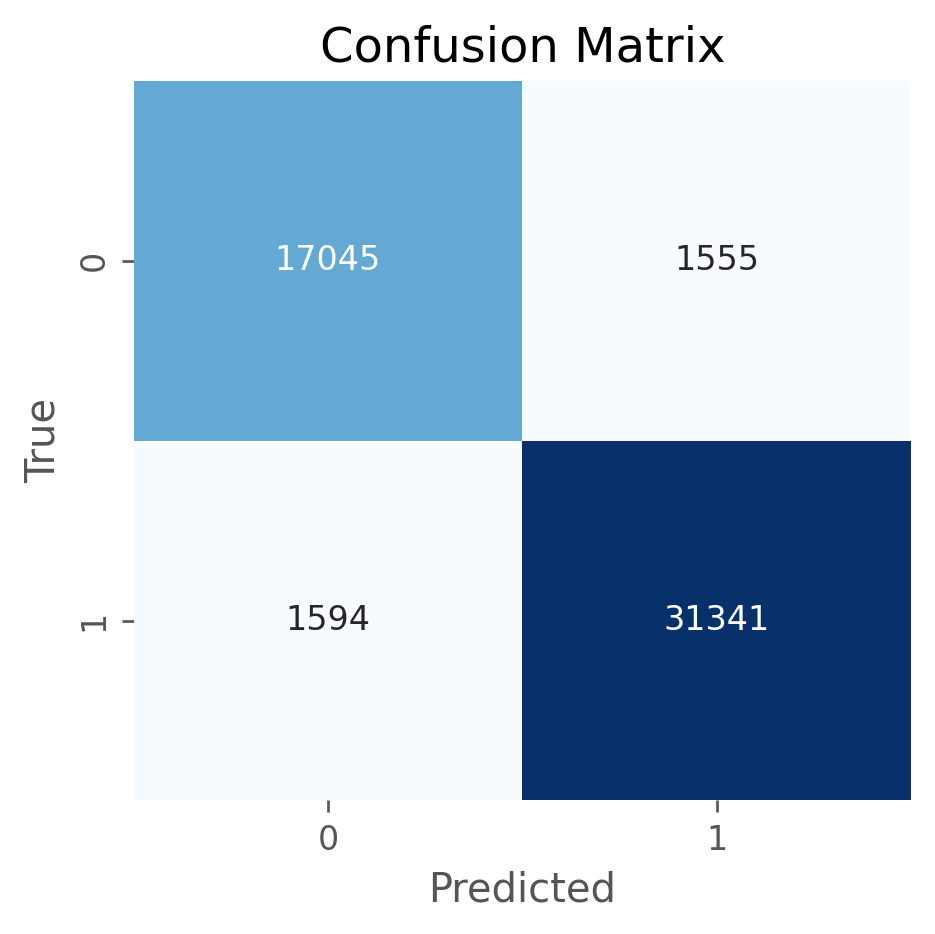

In [29]:
# Generate confusion matrix
y_pred = dt_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred, labels=unique_classes)

# Plot the confusion matrix
plt.figure(figsize=(4, 4), dpi=120)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=unique_classes, yticklabels=unique_classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')

plt.tight_layout()
plt.show()

<a id='4_6'></a>
## <p style="padding: 8px;color:white; display:fill;background-color:#aaaaaa; border-radius:5px; font-size:100%"> <b>Random Forest Classifier</b>

In [30]:
# Run experiment for Random Forest
print("Running Random Forest...")
rf_model = RandomForestClassifier()
rf_performance = run_experiment(rf_model, X_train, X_test, y_train, y_test)
rf_performance['Model'] = 'Random Forest'
overall_performance = pd.concat([overall_performance, rf_performance], ignore_index=True)

Running Random Forest...
Accuracy: 95.30%
Recall: 95.30%
Precision: 95.31%
F1-Score: 95.31%
TNR (Average): 94.99%
FPR (Average): 5.01%
FNR (Average): 5.01%
Time to train: 73.26 s
Time to predict: 1.15 s
Total time: 74.40 s


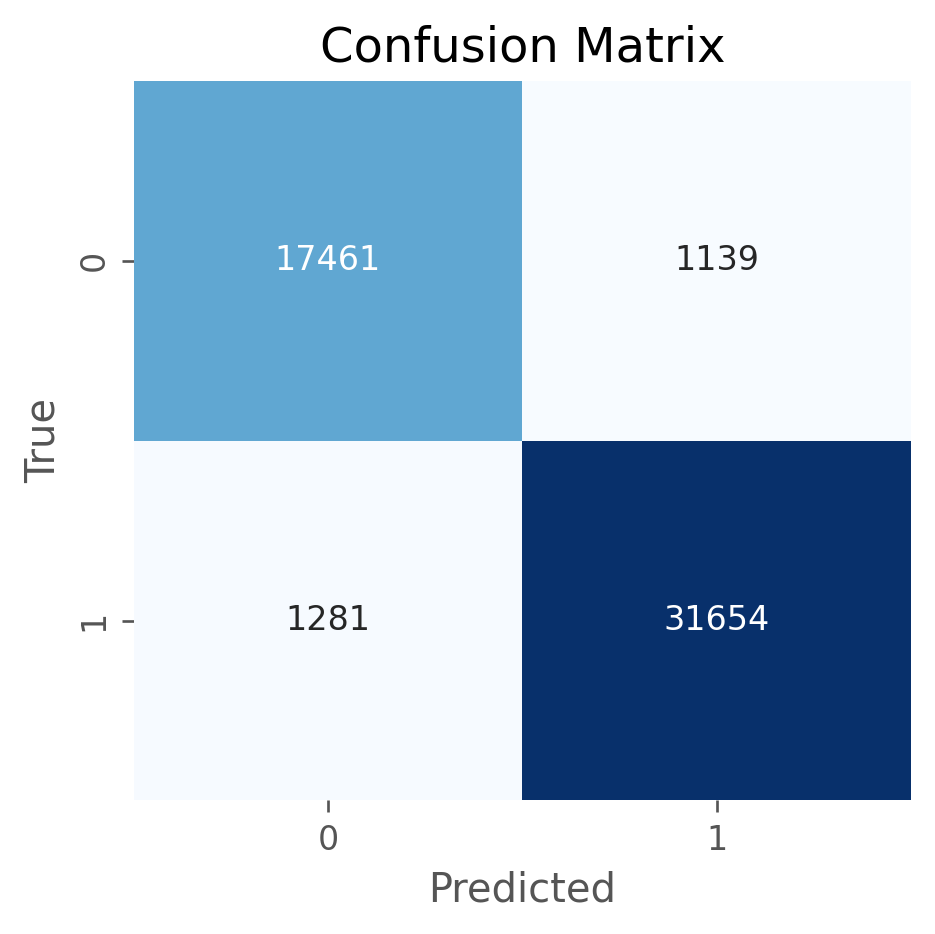

In [31]:
# Plot confusion matrix
y_pred = rf_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred, labels=unique_classes)

# Plot the confusion matrix
plt.figure(figsize=(4, 4), dpi=120)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=unique_classes, yticklabels=unique_classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')

plt.tight_layout()
plt.show()

<a id='4_6'></a>
## <p style="padding: 8px;color:white; display:fill;background-color:#aaaaaa; border-radius:5px; font-size:100%"> <b>XGBoost Classifier</b>

In [32]:
# Run experiment for XGBoost
print("Running XGBoost...")
xgb_model = XGBClassifier()
xgb_performance = run_experiment(xgb_model, X_train, X_test, y_train, y_test)
xgb_performance['Model'] = 'XGBoost'
overall_performance = pd.concat([overall_performance, xgb_performance], ignore_index=True)

Running XGBoost...
Accuracy: 94.95%
Recall: 94.95%
Precision: 94.99%
F1-Score: 94.96%
TNR (Average): 94.78%
FPR (Average): 5.22%
FNR (Average): 5.22%
Time to train: 8.13 s
Time to predict: 0.15 s
Total time: 8.29 s


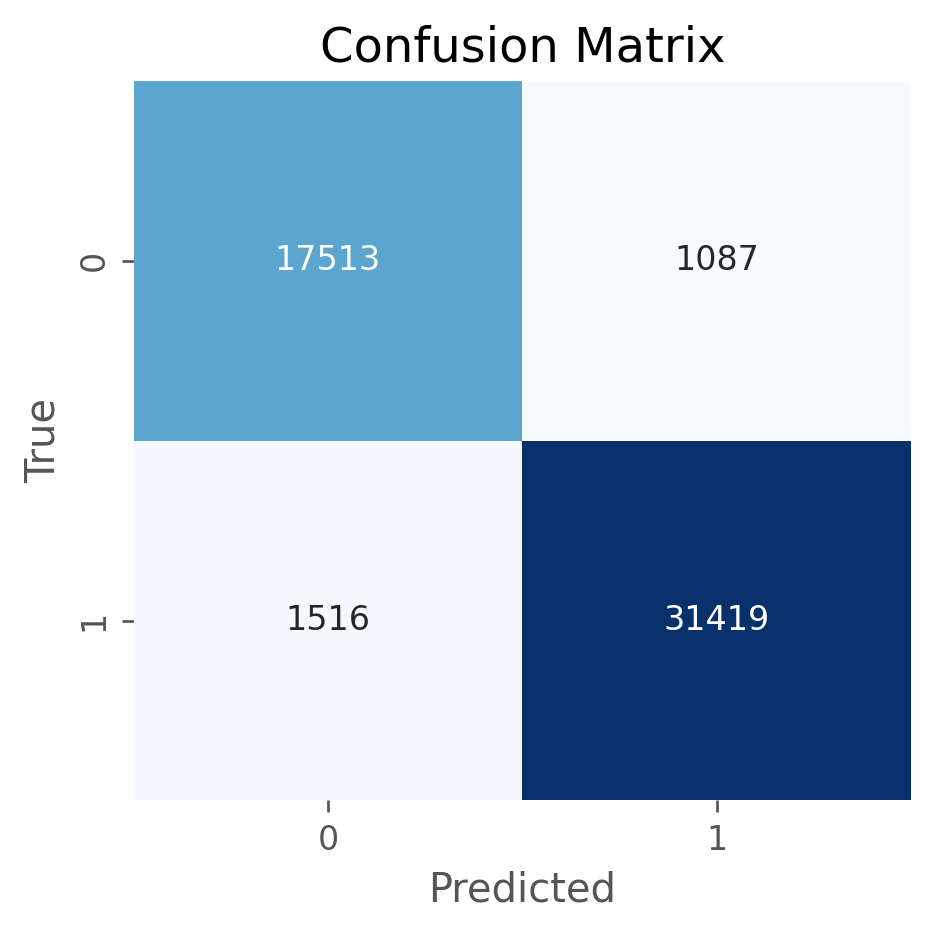

In [33]:
# Plot confusion matrix
y_pred = xgb_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred, labels=unique_classes)

# Plot the confusion matrix
plt.figure(figsize=(4, 4), dpi=120)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=unique_classes, yticklabels=unique_classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')

plt.tight_layout()
plt.show()

<a id='4_6'></a>
## <p style="padding: 8px;color:white; display:fill;background-color:#aaaaaa; border-radius:5px; font-size:100%"> <b>Neural Network (MLP) Classifier</b>

In [34]:
# Run experiment for MLP
print("Running MLP...")
mlp_model = MLPClassifier()
mlp_performance = run_experiment(mlp_model, X_train, X_test, y_train, y_test)
mlp_performance['Model'] = 'MLP'
overall_performance = pd.concat([overall_performance, mlp_performance], ignore_index=True)

Running MLP...
Accuracy: 81.18%
Recall: 81.18%
Precision: 85.26%
F1-Score: 79.11%
TNR (Average): 73.99%
FPR (Average): 26.01%
FNR (Average): 26.01%
Time to train: 112.13 s
Time to predict: 0.14 s
Total time: 112.26 s


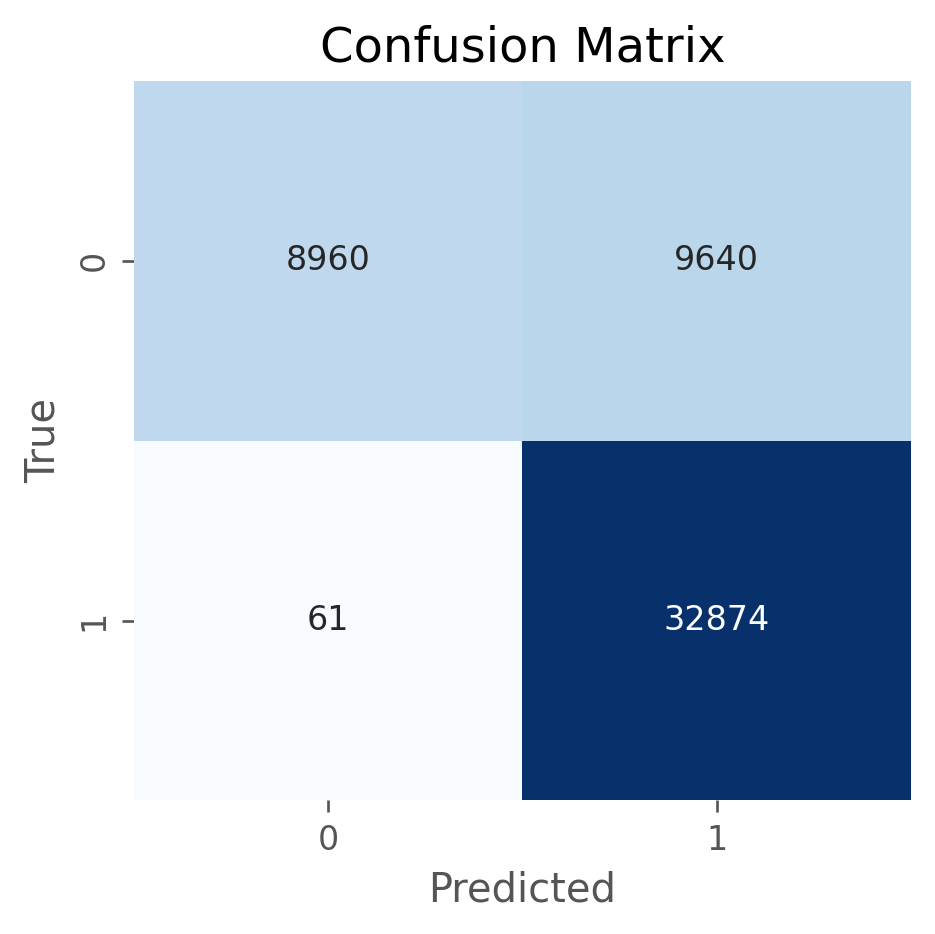

In [35]:
# Plot confusion matrix
y_pred = mlp_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred, labels=unique_classes)

# Plot the confusion matrix
plt.figure(figsize=(4, 4), dpi=120)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=unique_classes, yticklabels=unique_classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')

plt.tight_layout()
plt.show()

<a id='4_6'></a>
## <p style="padding: 8px;color:white; display:fill;background-color:#aaaaaa; border-radius:5px; font-size:100%"> <b>CNN</b>

In [36]:
from sklearn.model_selection import KFold

kf = KFold(n_splits=5, shuffle=True, random_state=42)

In [37]:
import tensorflow as tf

def evaluate_cnn(X_train, X_test, y_train, y_test):
    # Reshape the data
    X_train_reshaped = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
    X_test_reshaped = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

    # Define the CNN model
    cnn_model = tf.keras.Sequential([
        tf.keras.layers.Reshape((X_train.shape[1], 1), input_shape=(X_train.shape[1], 1)),
        tf.keras.layers.Conv1D(32, kernel_size=3, activation='relu'),
        tf.keras.layers.MaxPooling1D(pool_size=2),
        tf.keras.layers.Conv1D(64, kernel_size=3, activation='relu'),
        tf.keras.layers.MaxPooling1D(pool_size=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')  # Adjust for the number of classes
    ])

    cnn_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    # Timing training
    start_train = time.time()
    cnn_model.fit(X_train_reshaped, y_train, epochs=3, batch_size=32, verbose=0)
    end_train = time.time()

    # Timing prediction
    start_pred = time.time()
    y_pred_proba = cnn_model.predict(X_test_reshaped)
    y_pred = np.argmax(y_pred_proba, axis=1)
    end_pred = time.time()

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
    f1s = f1_score(y_test, y_pred, average='weighted')

    # Iterate over classes for 'ovr' AUC calculation
    auc_scores = []
    for class_idx in range(y_pred_proba.shape[1]):
        y_true_class = (y_test == class_idx).astype(int)  # Create binary labels for each class
        auc = roc_auc_score(y_true_class, y_pred_proba[:, class_idx])
        auc_scores.append(auc)

    # Average AUC scores
    auc = np.mean(auc_scores)

    # Compute timing metrics
    training_time = end_train - start_train
    prediction_time = end_pred - start_pred
    total_time = training_time + prediction_time

    return accuracy, recall, precision, f1s, auc, training_time, prediction_time, total_time

In [38]:
# Assuming X_train is your original training data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

# Cross-validation metrics storage
cv_accuracies, cv_recalls, cv_precisions, cv_f1s, cv_aucs = [], [], [], [], []

# Assuming kf is your cross-validation splitter (e.g., KFold)
for train_index, test_index in kf.split(X_train_scaled):
    X_train_fold, X_test_fold = X_train_scaled[train_index], X_train_scaled[test_index]
    y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]  # Use .iloc to access by position

    accuracy, recall, precision, f1s, auc, _, _, _ = evaluate_cnn(X_train_fold, X_test_fold, y_train_fold, y_test_fold)

    cv_accuracies.append(accuracy)
    cv_recalls.append(recall)
    cv_precisions.append(precision)
    cv_f1s.append(f1s)
    cv_aucs.append(auc)

# Compute average CV metrics
avg_cv_accuracy = np.mean(cv_accuracies)
avg_cv_recall = np.mean(cv_recalls)
avg_cv_precision = np.mean(cv_precisions)
avg_cv_f1s = np.mean(cv_f1s)
avg_cv_auc = np.mean(cv_aucs)

print(f"CV Accuracy: {avg_cv_accuracy:.2%}")
print(f"CV Recall: {avg_cv_recall:.2%}")
print(f"CV Precision: {avg_cv_precision:.2%}")
print(f"CV F1-Score: {avg_cv_f1s:.2%}")
print(f"CV AUC: {avg_cv_auc:.2%}")

1289/1289 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
1289/1289 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
CV Accuracy: 93.24%
CV Recall: 93.24%
CV Precision: 93.29%
CV F1-Score: 93.25%
CV AUC: 98.64%


In [39]:
# Train and evaluate the final model
cnn_model_final = tf.keras.Sequential([
    tf.keras.layers.Reshape((X_train_scaled.shape[1], 1), input_shape=(X_train_scaled.shape[1], 1)),
    tf.keras.layers.Conv1D(32, kernel_size=3, activation='relu'),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Conv1D(64, kernel_size=3, activation='relu'),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(2, activation='softmax')  # Adjust for the number of classes
])

In [40]:
cnn_model_final.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Timing final model training
start_train_final = time.time()
cnn_model_final.fit(X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1)), y_train, epochs=3, batch_size=32, verbose=0)
end_train_final = time.time()

# Timing final model prediction
start_pred_final = time.time()
y_pred_proba_final = cnn_model_final.predict(X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1)))
y_pred_final = np.argmax(y_pred_proba_final, axis=1)
end_pred_final = time.time()

# Calculate final metrics
accuracy_final, recall_final, precision_final, f1s_final, auc_final, training_time_final, prediction_time_final, total_time_final = evaluate_cnn(X_train_scaled, X_test_scaled, y_train, y_test)

1611/1611 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step
1611/1611 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


In [41]:
# Assuming you already have y_test and y_pred from the CNN evaluation
#cm = confusion_matrix(y_test, y_pred_final)

# Handle multi-class confusion matrix
FP = cm.sum(axis=0) - np.diag(cm)
FN = cm.sum(axis=1) - np.diag(cm)
TP = np.diag(cm)
TN = cm.sum() - (FP + FN + TP)

# Calculate TNR, FPR, and FNR (averaged over classes)
TNR = np.mean(TN / (TN + FP))
FPR = np.mean(FP / (FP + TN))
FNR = np.mean(FN / (FN + TP))

# Now include these in the performance DataFrame
cnn_performance = pd.DataFrame([{
    'CV Accuracy': avg_cv_accuracy,
    'CV Recall': avg_cv_recall,
    'CV Precision': avg_cv_precision,
    'CV F1-Score': avg_cv_f1s,
    'CV AUC': avg_cv_auc,
    'Test Accuracy': accuracy_final,
    'Test Recall': recall_final,
    'Test Precision': precision_final,
    'Test F1-Score': f1s_final,
    'Test AUC': auc_final,
    'TNR (Average)': TNR,  # TNR now calculated
    'FPR (Average)': FPR,  # FPR now calculated
    'FNR (Average)': FNR,  # FNR now calculated
    'Training Time': training_time_final,
    'Prediction Time': prediction_time_final,
    'Total Time': total_time_final,
    #'RMSE': np.nan  # Assuming RMSE is not calculated here
}])

1611/1611 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


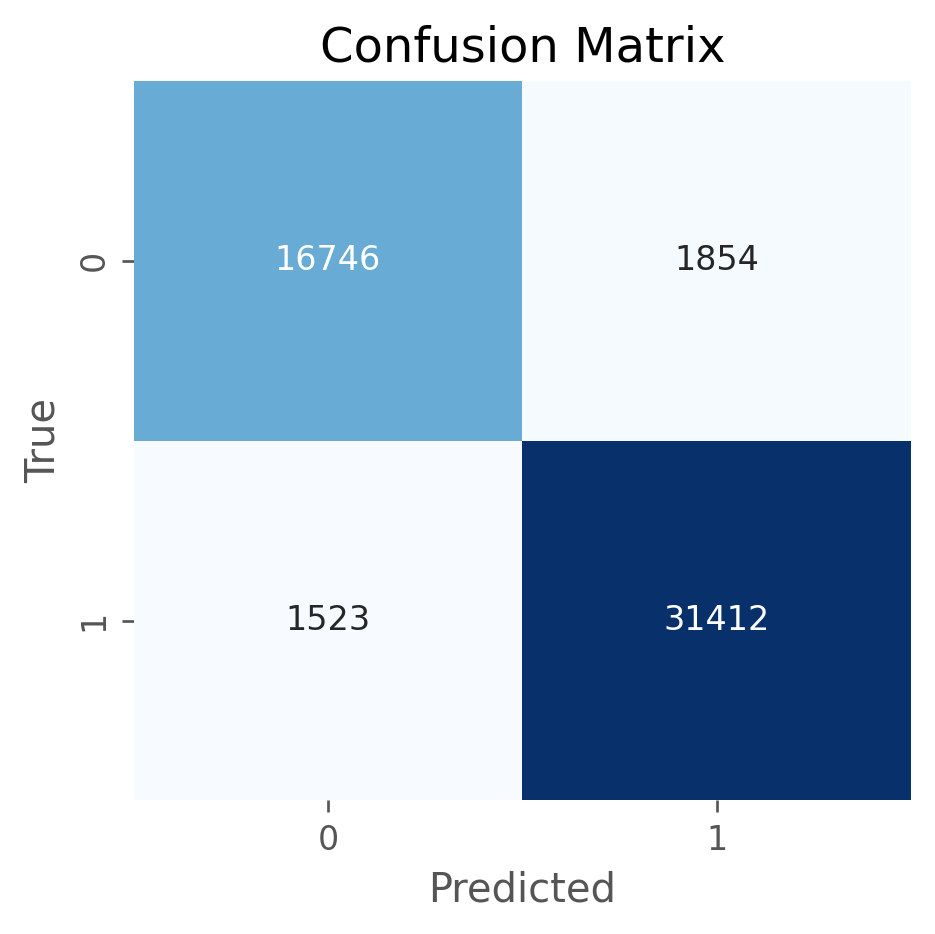

In [42]:
# Plot confusion matrix
y_pred = cnn_model_final.predict(X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))) # Scale X_test before prediction
cm = confusion_matrix(y_test, np.argmax(y_pred, axis=1), labels=unique_classes) # Extract predicted class labels

# Plot the confusion matrix
plt.figure(figsize=(4, 4), dpi=120)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=unique_classes, yticklabels=unique_classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')

plt.tight_layout()
plt.show()

In [43]:
# Print and optionally save the results
print(cnn_performance)

   CV Accuracy  CV Recall  CV Precision  CV F1-Score    CV AUC  Test Accuracy  Test Recall  Test Precision  Test F1-Score  Test AUC  TNR (Average)  FPR (Average)  FNR (Average)  Training Time  Prediction Time  Total Time
0     0.932419   0.932419      0.932918     0.932536  0.986386       0.934433     0.934433        0.934293       0.934343  0.987223       0.739934       0.260066       0.260066     114.858578         4.396175  119.254753


In [44]:
cnn_performance['Model'] = 'CNN'

overall_performance = pd.concat([overall_performance, cnn_performance], ignore_index=True)

In [45]:
# Print the overall performance DataFrame
print("Overall Performance:")
print(overall_performance)

Overall Performance:
           Model  CV Accuracy  CV Recall  CV Precision  CV F1-Score  Test Accuracy  Test Recall  Test Precision  Test F1-Score  TNR (Average)  FPR (Average)  FNR (Average)  Training Time  Prediction Time  Total Time    CV AUC  Test AUC
0  Decision Tree     0.935650   0.930589      0.929884     0.930144       0.938896     0.938896        0.938925       0.938910       0.934000       0.066000       0.066000       5.881974         0.038499    5.920473       NaN       NaN
1  Random Forest     0.949461   0.945895      0.944632     0.945330       0.953042     0.953042        0.953134       0.953080       0.949934       0.050066       0.050066      73.255660         1.149179   74.404839       NaN       NaN
2        XGBoost     0.946841   0.944598      0.940801     0.942634       0.949491     0.949491        0.949875       0.949613       0.947765       0.052235       0.052235       8.134826         0.153916    8.288742       NaN       NaN
3            MLP     0.805771   0.7

# Explainability

<a id='4_3'></a>
### <p style="padding: 8px;color:white; display:fill;background-color:#aaaaaa; border-radius:5px; font-size:100%"> <b>Decision Tree</b>


### Visualising the Rules

In [46]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [2, 28],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 2]
}

grid_search = GridSearchCV(dt_model, param_grid, cv=5, scoring='recall')
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)
print("Best recall score:", grid_search.best_score_)

Best parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best recall score: 1.0


In [47]:
clf=grid_search.best_estimator_
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

recall = recall_score(y_test, y_pred, average='macro') # Use 'macro' averaging for multiclass
print("Recall: ", recall)

Recall:  0.8215591397849462


:::::::> The RULES FOR HIGH RECALL RATE <::::::: 
 |--- sttl <= 61.00
|   |--- sinpkt <= 0.00
|   |   |--- class: 1
|   |--- sinpkt >  0.00
|   |   |--- class: 0
|--- sttl >  61.00
|   |--- synack <= 0.04
|   |   |--- class: 1
|   |--- synack >  0.04
|   |   |--- class: 1



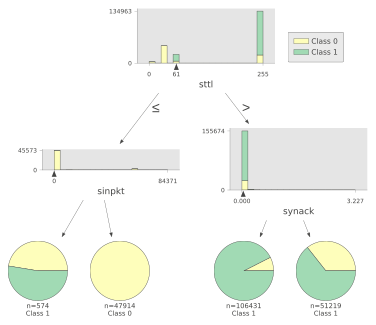

In [48]:
 # Import the missing function

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = '10'
print(":::::::> The RULES FOR HIGH RECALL RATE <::::::: \n" ,export_text(clf,feature_names=feature_names))

viz_model = dtreeviz.model(clf,
                           X_train=X_train, y_train=y_train,
                           feature_names=feature_names)
viz_model.view()

From the decision tree, we visualized the rule of tree as sttl<=-1.162 and sttl>1.162

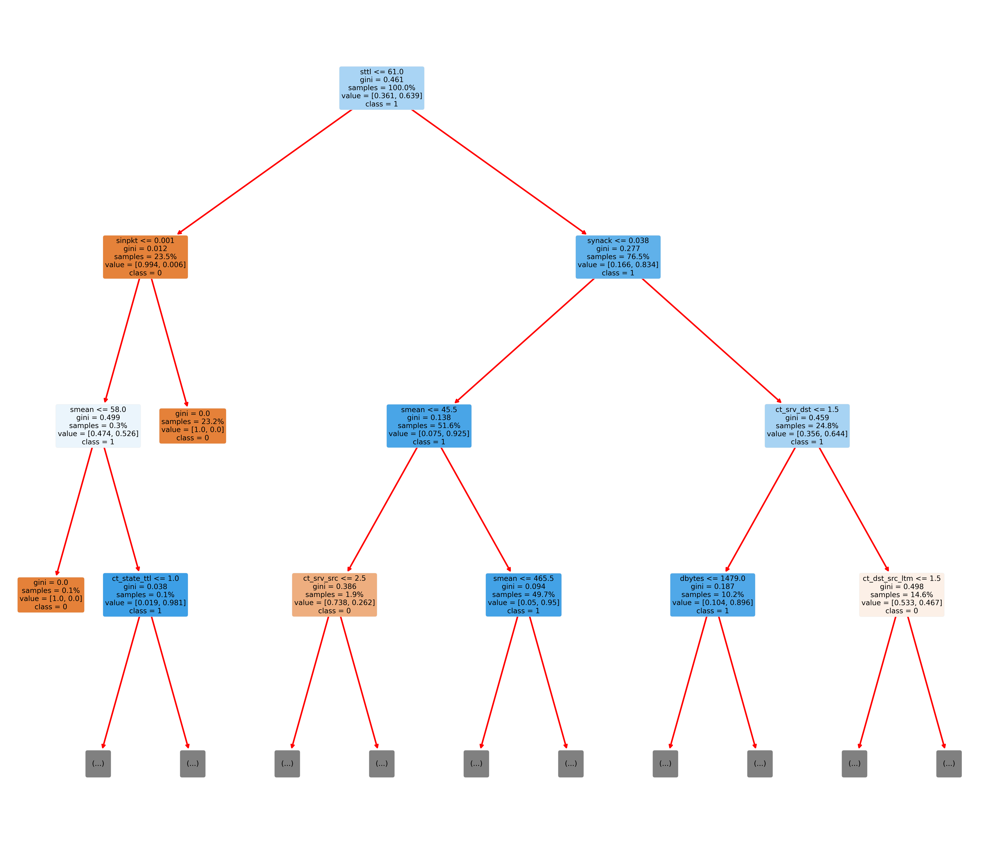

In [49]:
# Get the unique class labels from your data
unique_classes = np.unique(y_test)

# Plot the decision tree
fig = plt.figure(figsize=(35, 30))
DTtree = tree.plot_tree(dt_model, feature_names=feature_names,
                       class_names=unique_classes.astype(str),  # Use actual class labels
                       fontsize=14, proportion=True, filled=True,
                       rounded=True, max_depth=3)

# Customize the arrows
for o in DTtree:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('red')
        arrow.set_linewidth(3)

# Save the figure
fig.savefig('Decision Tree Classifier XAI Visualization Part 2.png')

### Global explanation: Permutation & Feature Importance

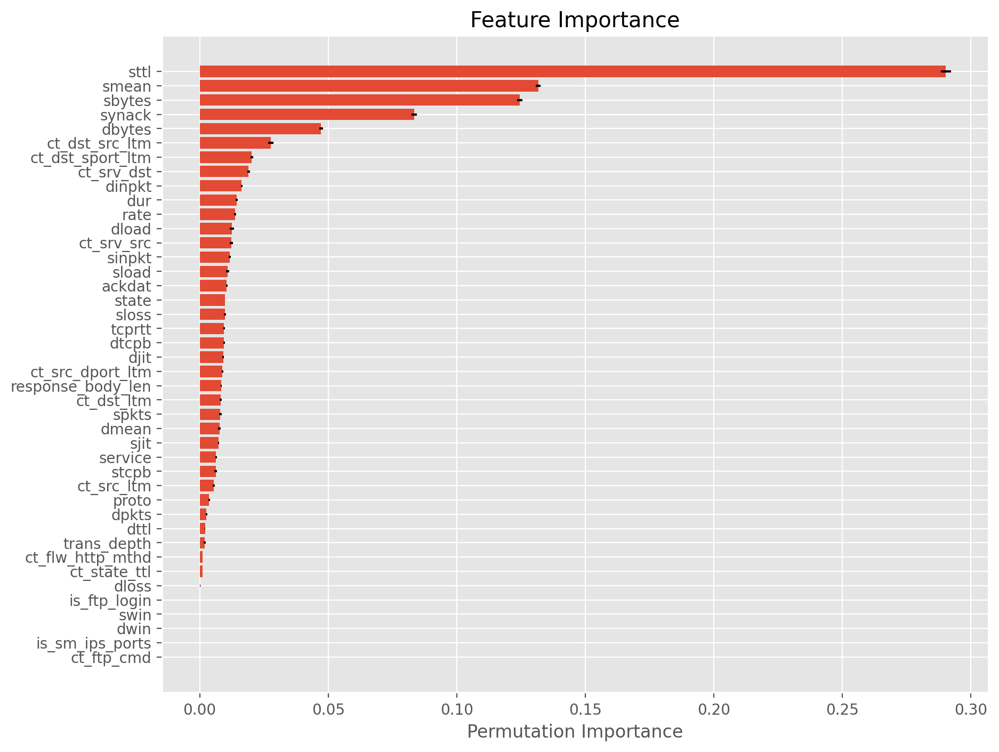

In [50]:
# Set n_jobs to 1 to disable parallel processing
result = permutation_importance(dt_model, X_test, y_test, n_repeats=10, random_state=1, n_jobs=1)

# Extract feature importance and standard deviation
importance = result.importances_mean
std = result.importances_std

# Sort features by importance
indices = np.argsort(importance)

# Plot the feature importance
plt.figure(figsize=(10, 8))
plt.barh(range(len(indices)), importance[indices], xerr=std[indices], align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Permutation Importance')
plt.title('Feature Importance')
plt.show()

<a id='4_5'></a>
## <p style="padding: 8px;color:white; display:fill;background-color:#aaaaaa; border-radius:5px; font-size:100%"> <b>Random Forest</b>

### Visualizing the rules present in the tree

In [51]:
#!pip install matplotlib
#import matplotlib.pyplot as plt
#from sklearn.tree import plot_tree

# Access an estimator within the valid index range (0 to 39)
#plt.figure(figsize=(20,10))
#plot_tree(rf_model.estimators_[0], feature_names=feature_names, filled=True, class_names=True)
#plt.show()

### Global explanation: Feature importance

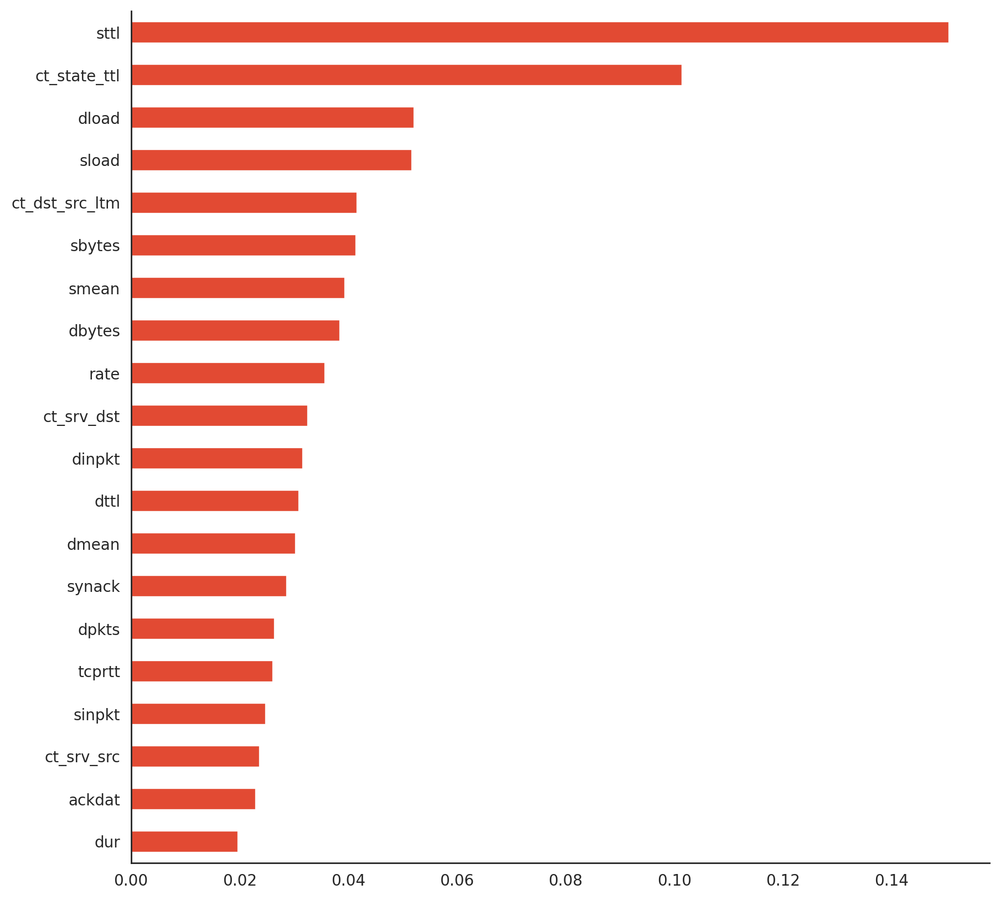

In [52]:
plt.rcParams['figure.figsize']=10,10
sns.set_style("white")
feat_importances = pd.Series(rf_model.feature_importances_, index=feature_names)
feat_importances = feat_importances.groupby(level=0).mean()
feat_importances.nlargest(20).plot(kind='barh').invert_yaxis()
sns.despine()
plt.show()

<a id='4_6'></a>
## <p style="padding: 8px;color:white; display:fill;background-color:#aaaaaa; border-radius:5px; font-size:100%"> <b>Gradient Boosting Classifier</b>

### Visualizing the rules present in the tree

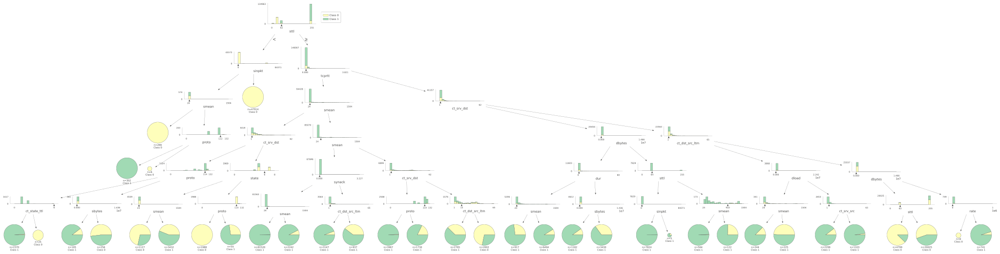

In [53]:
# Check for duplicate feature names
from collections import Counter # import Counter from collections module

duplicates = [name for name, count in Counter(feature_names).items() if count > 1]

# If duplicates exist, print them and suggest a fix
if duplicates:
    print(f"Duplicate feature names found: {duplicates}")
    print("Consider renaming features or removing duplicates to ensure unique feature names.")

# Example of renaming duplicate features (replace this with your actual renaming logic)
feature_names = [f"{name}_{i}" if name in duplicates else name for i, name in enumerate(feature_names)]

# Now call dtreeviz.model with the updated feature_names
viz_model = dtreeviz.model(xgb_model,tree_index=1,
                           X_train=X_train, y_train=y_train,
                           feature_names=feature_names)
viz_model.view()

### Global explanation: Feature importance

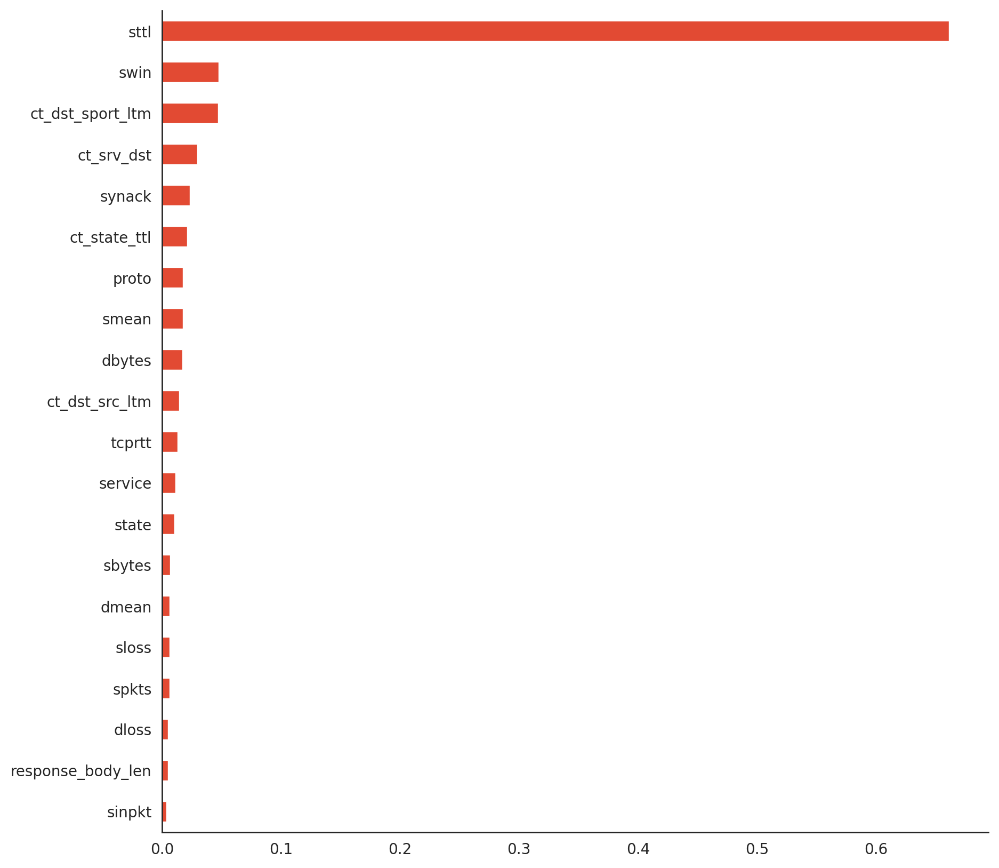

In [54]:
plt.rcParams['figure.figsize']=10,10
sns.set_style("white")
feat_importances = pd.Series(xgb_model.feature_importances_, index=feature_names)
feat_importances = feat_importances.groupby(level=0).mean()
feat_importances.nlargest(20).plot(kind='barh').invert_yaxis()
sns.despine()
plt.show()

### SHAP Explanation

In [55]:
# this takes a minute or two since we are explaining over 30 thousand samples in a model with over a thousand trees
import shap
explainer = shap.TreeExplainer(xgb_model)
shap_values_test = explainer.shap_values(X_test)

#### Visualising Sample Single Prediction

In [56]:
# Initialize JS visualization code
shap.initjs()

index_to_use = 50  # Make sure this index is within bounds

# Ensure the index is within bounds
if index_to_use < shap_values_test.shape[0] and index_to_use < X_test.shape[0]:
    # Generate the SHAP force plot
    # For a multi-class problem, you need to pick which class to explain.
    # Passing the index of the class you want to explain
    # (0 for the first class, 1 for the second class, etc.)
    force_plot = shap.force_plot(
        explainer.expected_value,          # Use the expected value for the model
        shap_values_test[index_to_use], # Select SHAP values for the chosen instance
        X_test.iloc[index_to_use, :].values             # Features of the instance being explained
    )

    # Display the force plot (in case it's not automatically displayed)
    display(force_plot)
else:
    print(f"Error: index_to_use {index_to_use} is out of bounds for shap_values_test or X_test.")

### Bar chart of mean importance

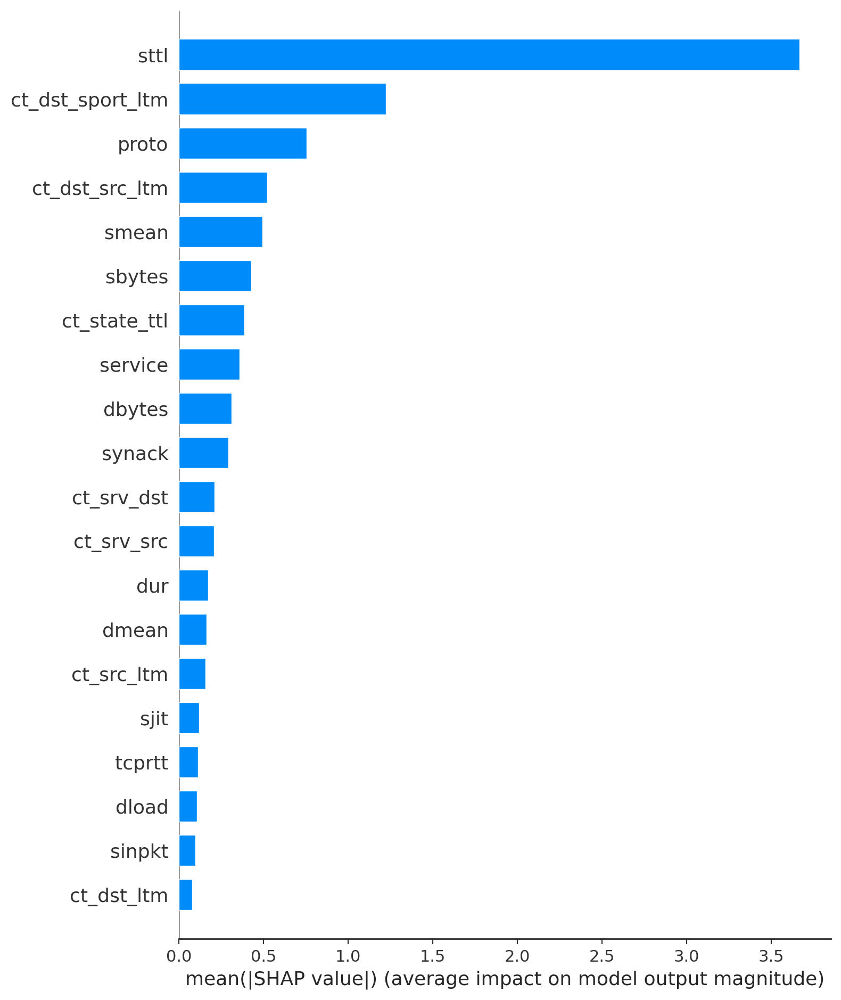

In [57]:
shap.summary_plot(shap_values_test, X_test, plot_type="bar")

SHAP Summary Plot: Rather than use a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. It is interesting to note that the relationship feature has more total model impact than the captial gain feature, but for those samples where capital gain matters it has more impact than age. In other words, capital gain effects a few predictions by a large amount, while age effects all predictions by a smaller amount.

Note that when the scatter points don't fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.

SHAP dependence plots show the effect of a single feature across the whole dataset. They plot a feature's value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature is chosen for coloring to highlight possible interactions.

#### SHAP Dependence Plot

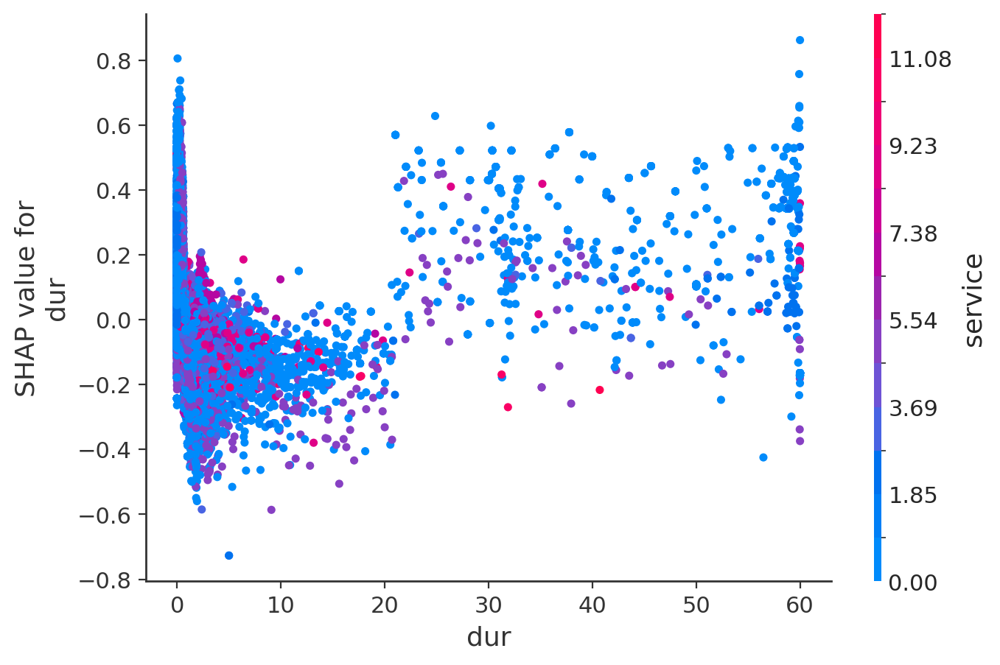

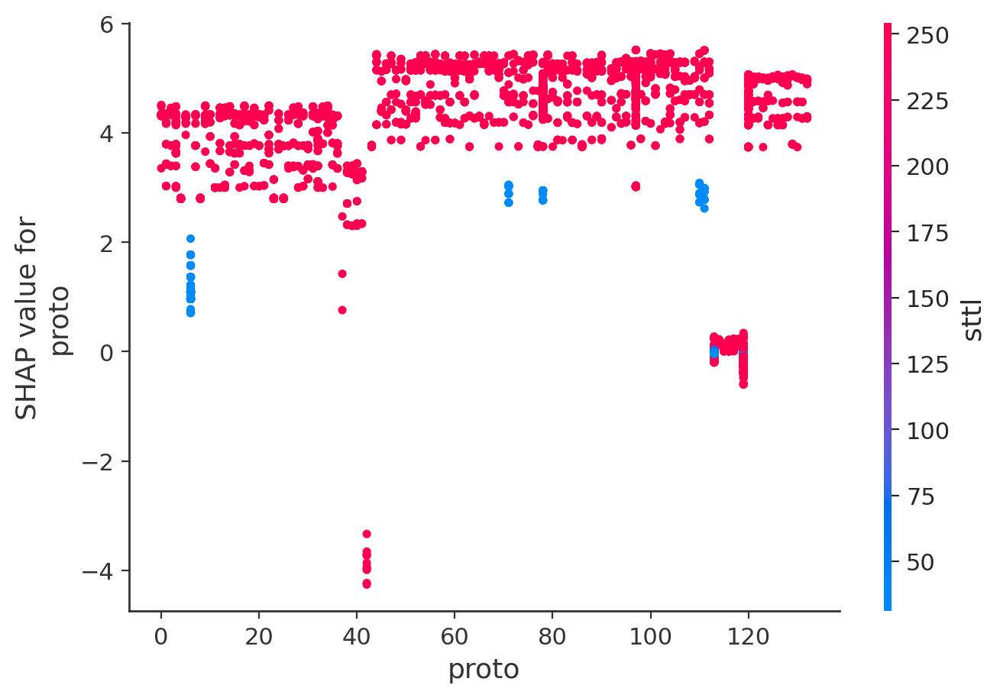

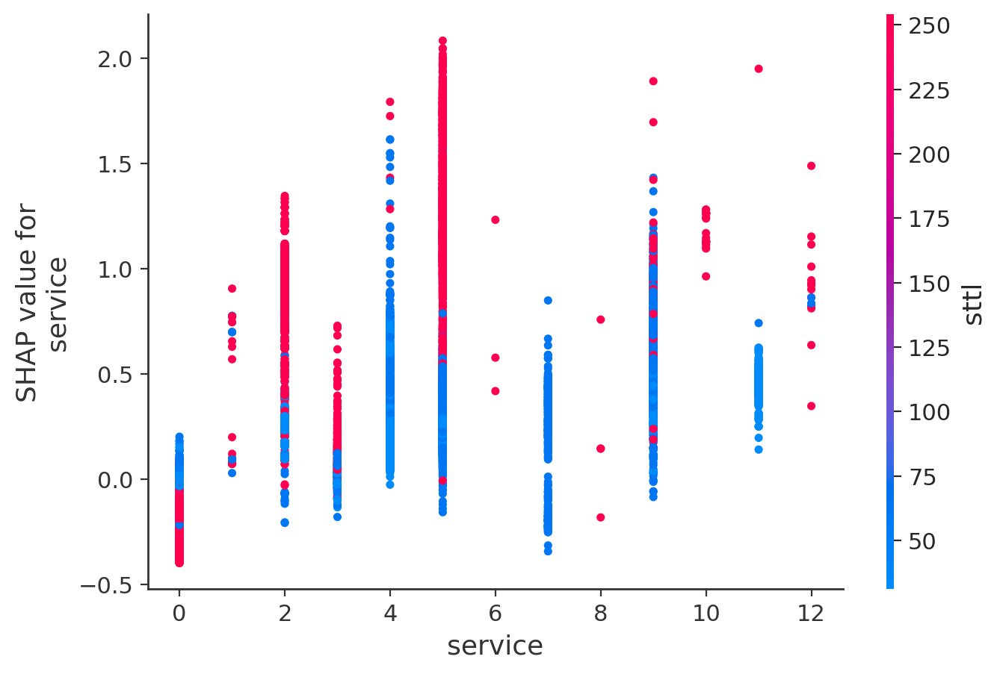

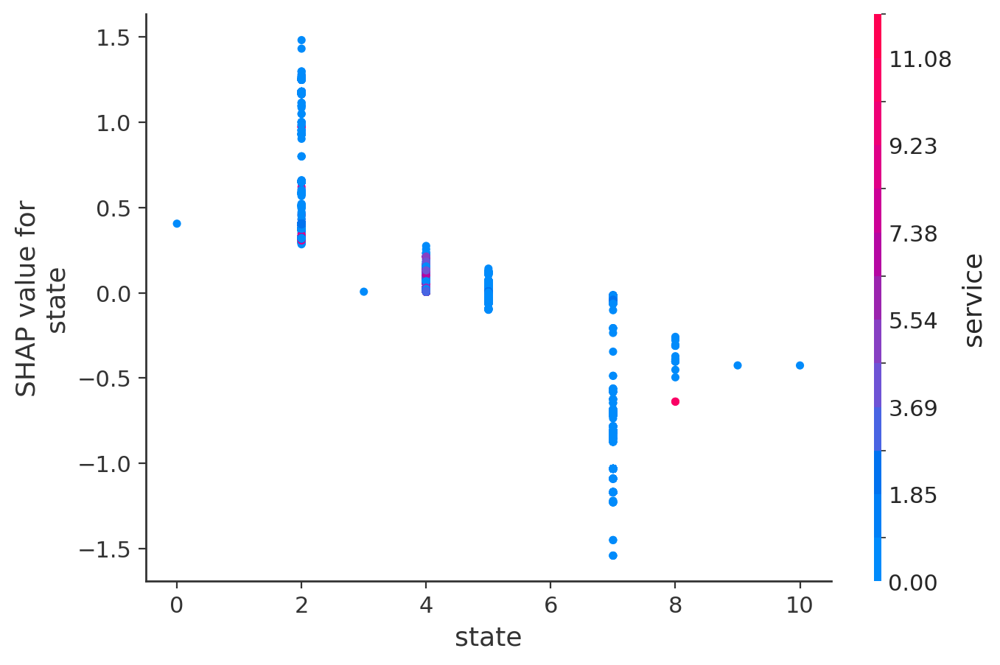

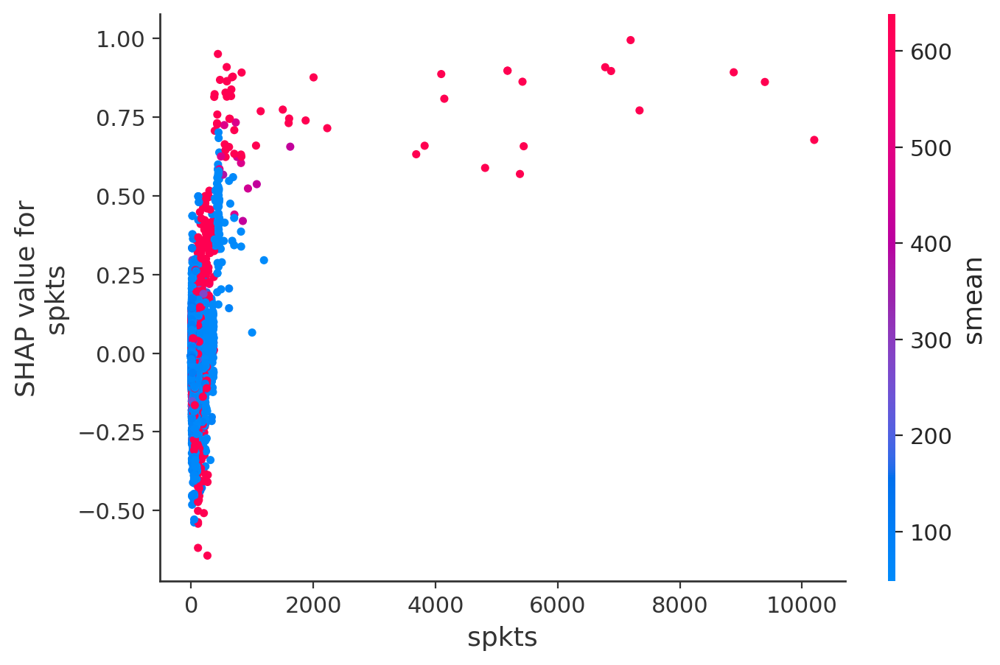

...

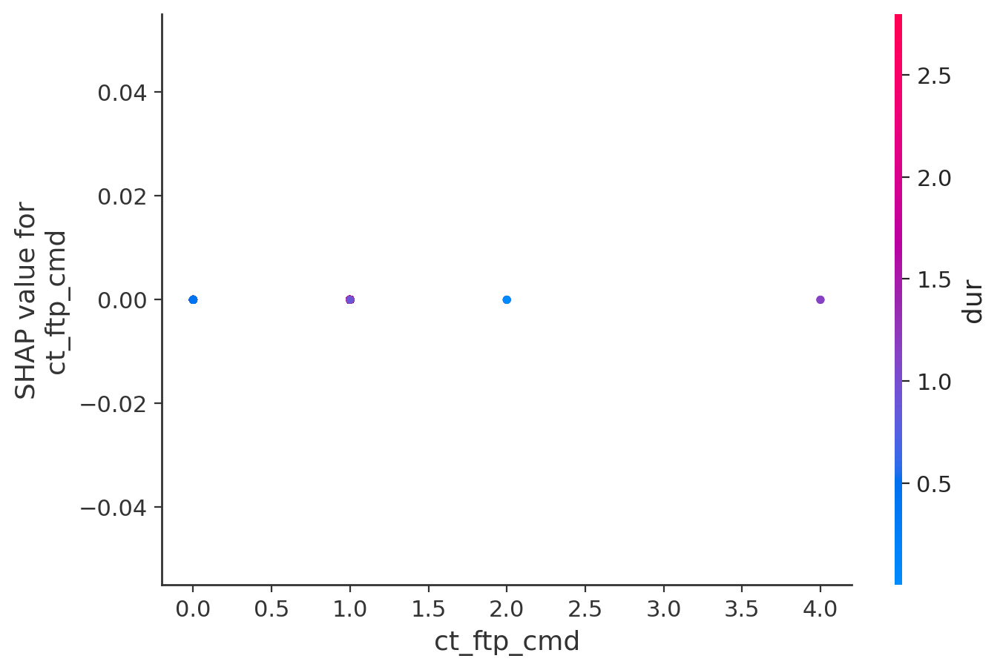

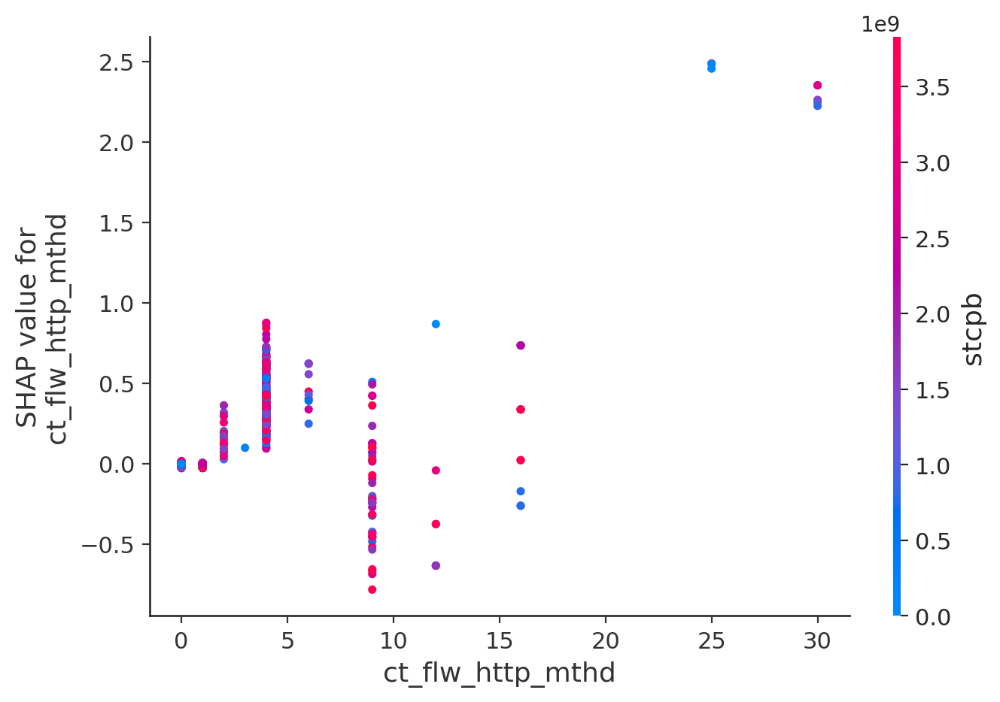

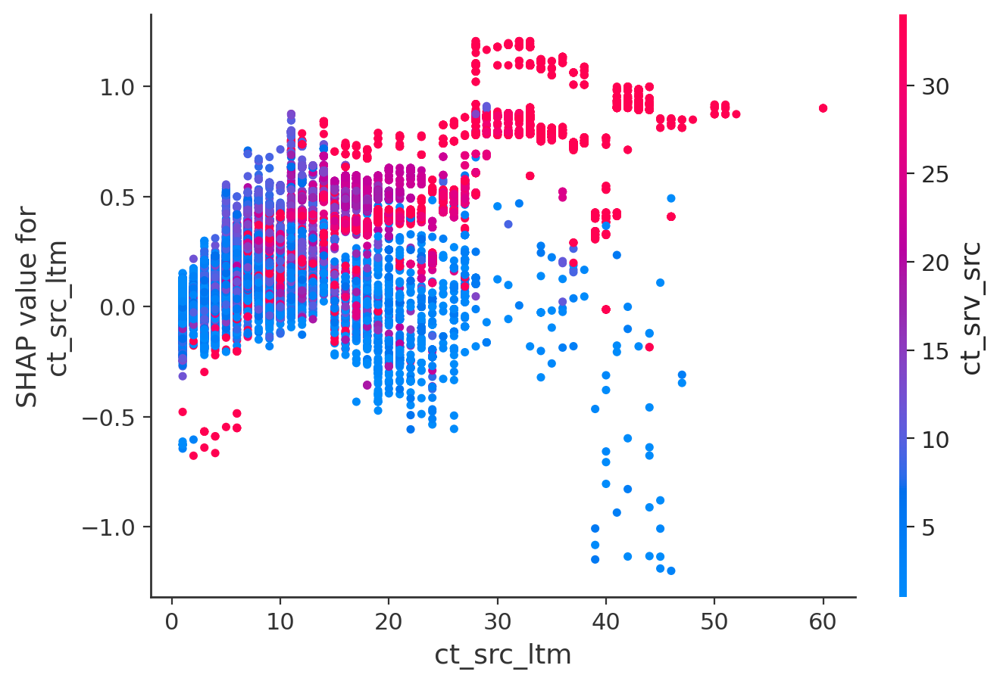

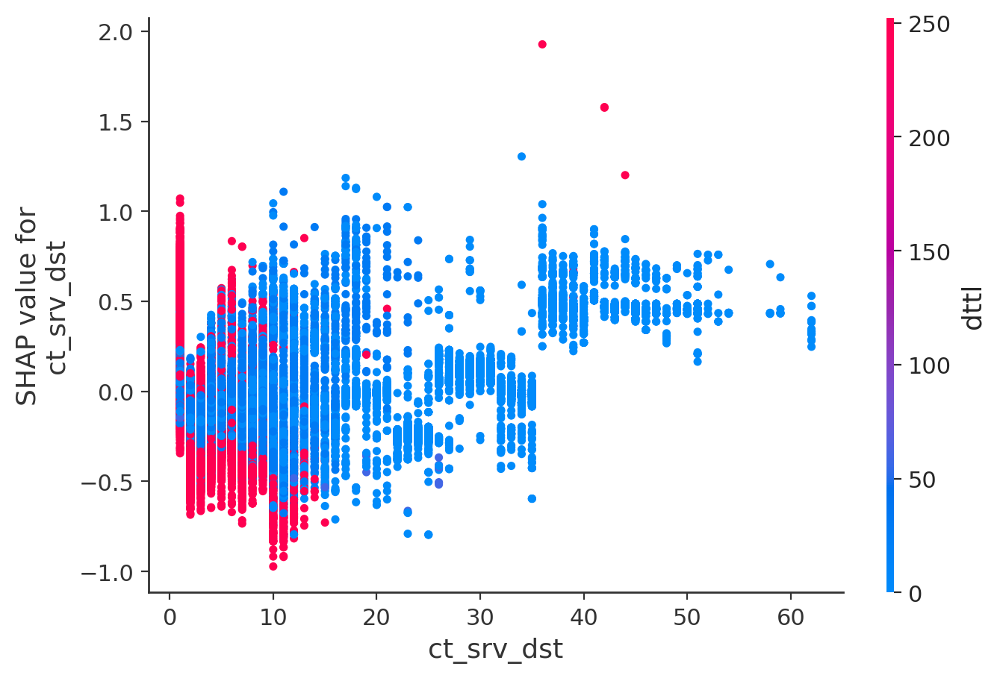

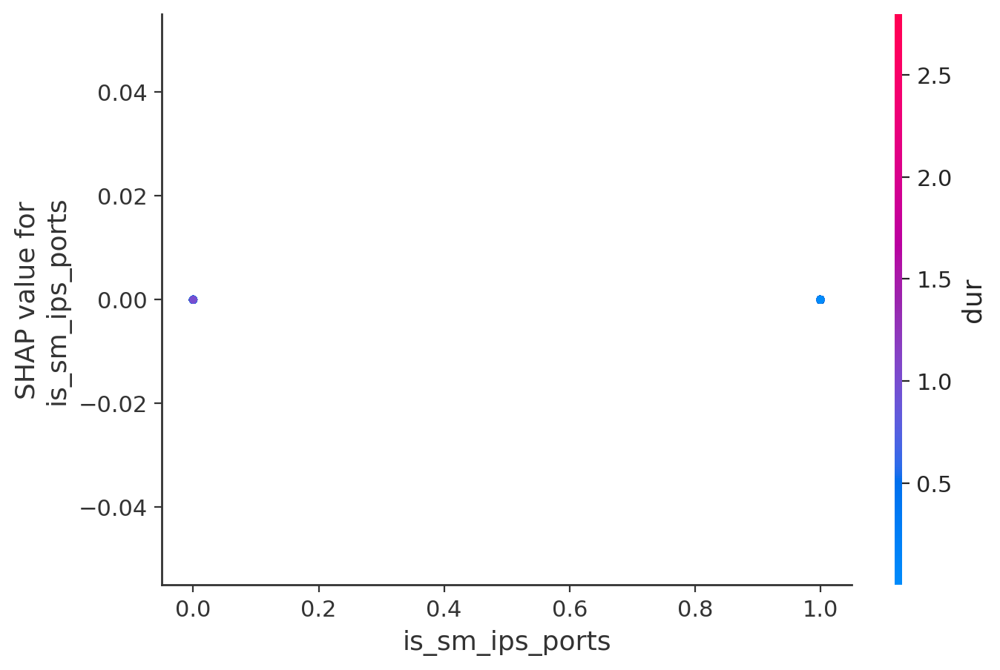

In [58]:
# Ensure X_test is a DataFrame
if isinstance(X_test, np.ndarray):
    X_test = pd.DataFrame(X_test, columns=feature_names)

# Initialize JS for the SHAP plots
shap.initjs()

# Generate SHAP dependence plots
for name in X_test.columns:
    # Check if shap_values_test is a list (for different model outputs or classes)
    if isinstance(shap_values_test, list):
        # Assuming shap_values_test is a list of arrays for different classes
        # Select the SHAP values for a specific class (e.g., the first class)
        shap_values_for_plot = shap_values_test[0]  # Change this index as needed
    else:
        shap_values_for_plot = shap_values_test

    # Ensure the number of features in SHAP values matches X_test
    if shap_values_for_plot.ndim == 3:
        # If SHAP values have an extra dimension for classes, select one class (e.g., the first class)
        shap_values_for_plot = shap_values_for_plot[:, :, 0]  # Select class 0, adjust as necessary

    # Generate the SHAP dependence plot
    shap.dependence_plot(name, shap_values_for_plot, X_test, display_features=X_test)

Compute SHAP Interaction Values

See the Tree SHAP paper for more details, but briefly, SHAP interaction values are a generalization of SHAP values to higher order interactions. Fast exact computation of pairwise interactions are implemented in the latest version of XGBoost with the pred_interactions flag. With this flag XGBoost returns a matrix for every prediction, where the main effects are on the diagonal and the interaction effects are off-diagonal. The main effects are similar to the SHAP values you would get for a linear model, and the interaction effects captures all the higher-order interactions are divide them up among the pairwise interaction terms. Note that the sum of the entire interaction matrix is the difference between the model's current output and expected output, and so the interaction effects on the off-diagonal are split in half (since there are two of each). When plotting interaction effects the SHAP package automatically multiplies the off-diagonal values by two to get the full interaction effect.

SHAP Interaction Value Summary Plot

A summary plot of a SHAP interaction value matrix plots a matrix of summary plots with the main effects on the diagonal and the interaction effects off the diagonal.

<a id='4_3'></a>
### <p style="padding: 8px;color:white; display:fill;background-color:#aaaaaa; border-radius:5px; font-size:100%"> <b>MLP</b>

#### SHAP Values

In [59]:
explainer = shap.KernelExplainer(mlp_model.predict_proba, X_test.iloc[:20,:])  # Use predict_proba for probabilities
shap_values = explainer.shap_values(X_test.iloc[:20,:])

  0%|          | 0/20 [00:00<?, ?it/s]

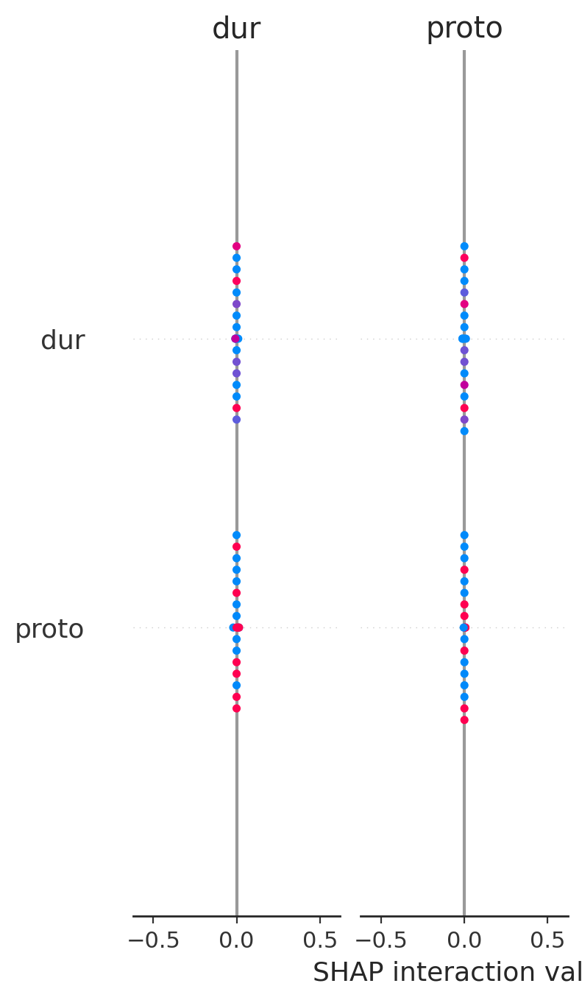

In [60]:
# takes a couple minutes since SHAP interaction values take a factor of 2 * # features
# more time than SHAP values to compute, since this is just an example we only explain
# the first 200 in order to run quicker

# Plot the summary using the SHAP values
shap.summary_plot(shap_values, X_test.iloc[:20,:])

## LIME

These are just a mix of the continuous and categorical examples we showed before. For categorical features, the feature contribution is always the same as the linear model weight.

In [61]:
predict_fn = lambda x: mlp_model.predict_proba(x).astype(float)

In [62]:
# Convert your Pandas DataFrame to a NumPy array
X_train_array = X_train.values

# Now initialize the explainer with the NumPy array
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_array,  # Use the NumPy array here
    feature_names=feature_names,
    class_names=['Normal', 'Attack'],
    kernel_width=3
)

In [63]:
i = 400
exp = explainer.explain_instance(X_test.iloc[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)

<a id='4_3'></a>
### <p style="padding: 8px;color:white; display:fill;background-color:#aaaaaa; border-radius:5px; font-size:100%"> <b>CNN</b>

### LIME

In [64]:
# Reshape X_test_scaled to 2D (samples, features) for LIME
X_test_scaled_reshaped = X_test_scaled.reshape(X_test_scaled.shape[0], -1)

# Initialize LIME Tabular Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled.reshape(X_train_scaled.shape[0], -1),  # Reshape training data to 2D
    feature_names=feature_names,  # List of feature names in your dataset
    class_names=['Normal', 'Attack'],  # Class names corresponding to your target classes
    mode='classification'  # Since it's a classification problem
)

# Choose an instance to explain
i = 100  # The index of the instance in the test set

# Explain the instance
exp = explainer.explain_instance(
    data_row=X_test_scaled_reshaped[i],  # Pass the reshaped 2D row
    predict_fn=lambda x: cnn_model_final.predict(x.reshape(x.shape[0], X_test_scaled.shape[1], 1)),  # Return probabilities for all classes
    num_features=10  # Number of features to display
)

# Show explanation
exp.show_in_notebook(show_all=False)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
